<a href="https://colab.research.google.com/github/jm042524/Prog2kakushin/blob/main/work1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
pip install cv2

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
ERROR: Could not find a version that satisfies the requirement cv2 (from versions: none)
ERROR: No matching distribution found for cv2


In [ ]:
pip install nltk

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import nltk
nltk.download("punkt")

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [ ]:
pip install pygame

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
pip install lyricsgenius

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


##テーマ：Pandas
好きな歌手の曲によく出てくる単語を表示するプログラムを作成します。(Pandasとmatplotlib)

In [ ]:
#コード：
import pandas as pd
import numpy
import seaborn as sns
import matplotlib.pyplot as plt
import cv2
import nltk
import pygame
import os
import time
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from PIL import Image, ImageDraw, ImageFont
from google.colab.patches import cv2_imshow
from sys import exit
from google.colab.patches import cv2_imshow
from google.colab import output


data = pd.read_csv("Songs.csv")

In [ ]:
# data.head()
data.head()

,Artist,Title,Lyrics
0,Taylor Swift,cardigan,"Vintage tee, brand new phone\nHigh heels on co..."
1,Taylor Swift,exile,"I can see you standing, honey\nWith his arms a..."
2,Taylor Swift,Lover,We could leave the Christmas lights up 'til Ja...
3,Taylor Swift,the 1,"I'm doing good, I'm on some new shit\nBeen say..."
4,Taylor Swift,Look What You Made Me Do,I don't like your little games\nDon't like you...


In [ ]:
# データに含まれているアーティスト
print("Artists in the data:\n", data.Artist.value_counts())

Artists in the data:
 Taylor Swift          50
David Bowie           50
Billy Joel            50
Eric Clapton          50
Billie Eilish         50
Leonard Cohen         50
Bruce Springsteen     40
The Beatles           35
Ray LaMontagne        30
Elton John            30
Queen                 30
Frank Sinatra         30
John Denver           30
Bryan Adams           30
​twenty one pilots    30
Nat King Cole         30
Lana Del Rey          30
Vance Joy             30
George Michael        30
Bob Dylan             20
Ed Sheeran            20
Name: Artist, dtype: int64


In [ ]:
# データの形
print("Size of Dataset:", data.shape)

Size of Dataset: (745, 3)


In [ ]:
# 文字数、語数、行数の列を作る
data["No_of_Characters"] = data["Lyrics"].apply(len)
data["No_of_Words"] = data.apply(lambda row: nltk.word_tokenize(row["Lyrics"]), axis=1).apply(len)   #nltkで言葉の判定の簡略化
data["No_of_Lines"] = data["Lyrics"].str.split('\n').apply(len)                                      #改行で分ける
data.describe()

,No_of_Characters,No_of_Words,No_of_Lines
count,745.000000,745.000000,745.000000
mean,1403.347651,319.400000,46.277852
std,666.721467,156.163646,21.180531
min,1.000000,1.000000,1.000000
25%,946.000000,215.000000,33.000000
50%,1289.000000,291.000000,44.000000
75%,1714.000000,389.000000,56.000000
max,7267.000000,1652.000000,224.000000


<Figure size 1080x1080 with 0 Axes>

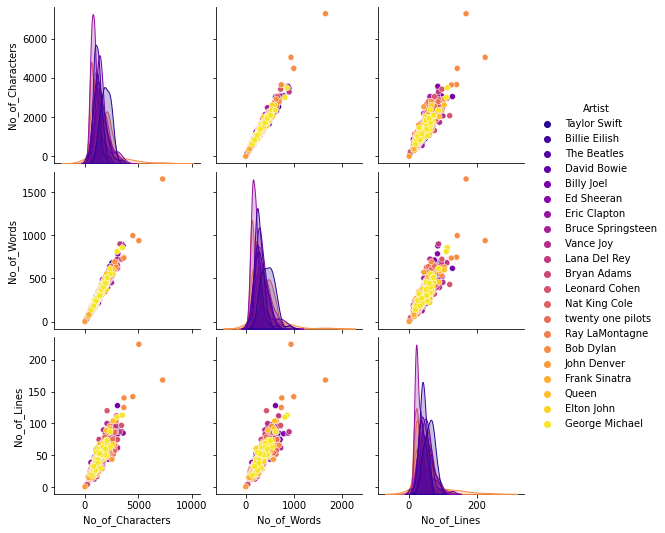

In [ ]:
# アーティストの曲の長さを(文字数、語数、行数により)比較
plt.figure(figsize=(15,15))
ax = sns.pairplot(data, hue="Artist", palette="plasma")
plt.show()

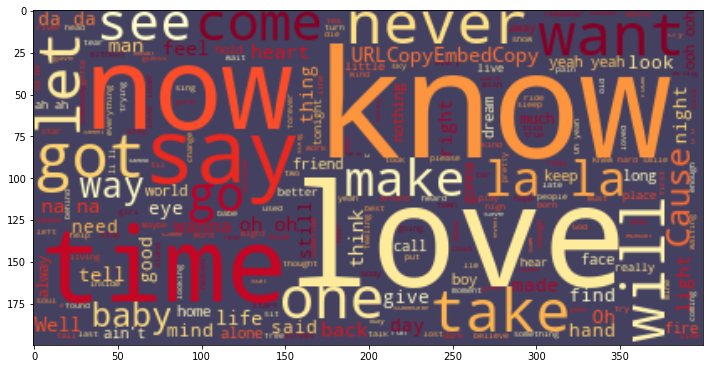

In [ ]:
# 頻度の高い言葉を大きく表示する
stopwords = set(STOPWORDS)
wordcloud = WordCloud(stopwords=stopwords, background_color="#444160",colormap="YlOrRd", max_words=800).generate(" ".join(data["Lyrics"]))
plt.figure(figsize=(12,12))
plt.imshow(wordcloud, interpolation="bilinear")             #バイリニア補間
plt.show()

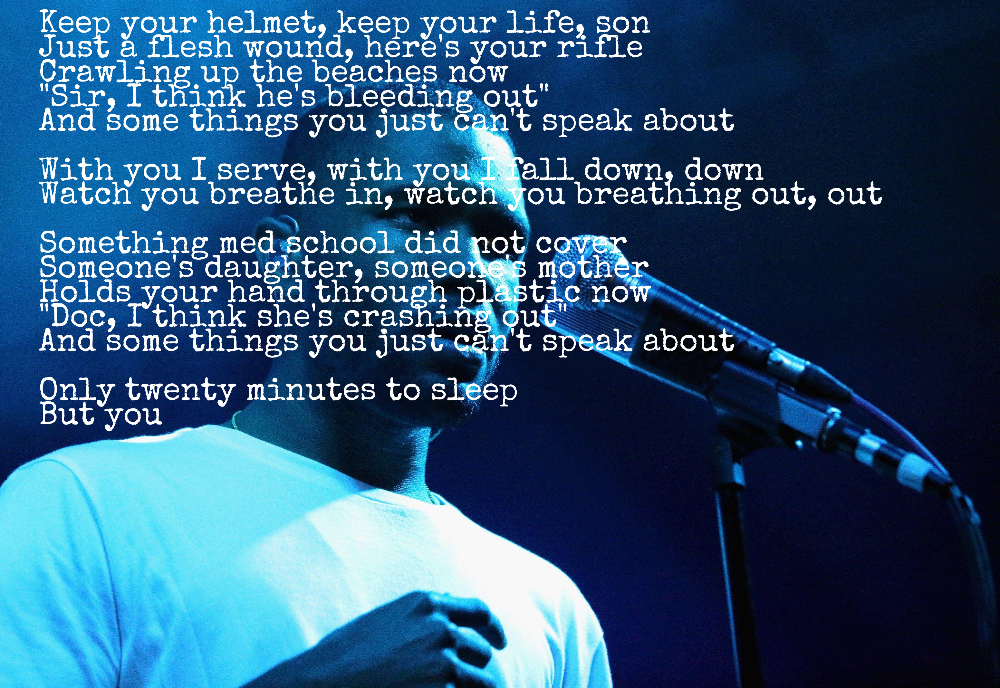

In [ ]:
#ある曲の最初の500文字を指定写真上に表示(cv2以外でやってみました。)
def My_song(song):
    img = Image.open("frankOcean.jpg")
    Text_on_image = ImageDraw.Draw(img)
    myFont = ImageFont.truetype("SpecialElite.ttf", 100)
    Text_on_image.text((120, 30), song, font=myFont, fill =(255, 255, 255))
    return img 

My_song(data.Lyrics[42][:500])

# ここで動画とゲームは写真を連載しているだけだから～
# ユーチューブでよくある、歌詞動画を作れないか？
# また普通の動画モジュールではなく、
# 理論上ゲームのモジュールでも作れる(pygame)から
# pygameで作ってみました。

In [ ]:
# 曲と歌詞のcsvをgeniusのデータを利用して、作成する
"""import lyricsgenius as genius
def lyricsCsv(artistName):
  api = genius.Genius('アクセスコード')                    #geniusのデータベースを利用する
  artist = api.search_artist(artistName)                  #アーテイストを探す
  genius_songs = artist.songs                             #アーティストの曲を探す
  lyric_df = pd.DataFrame(columns=['title', 'lyrics'])    #データフレーム作成
  for x in genius_songs:
      lyric_df = lyric_df.append({
          'title': x.title,
          'lyrics': x.lyrics
      }, ignore_index=True)
  lyric_df.to_csv("lyric.csv", index=False)
  print("Lyrics saved!")

lyricsCsv("Frank Ocean")"""

'import lyricsgenius as genius\ndef lyricsCsv(artistName):\n  api = genius.Genius(\'アクセスコード\')                    #geniusのデータベースを利用する\n  artist = api.search_artist(artistName)                  #アーテイストを探す\n  genius_songs = artist.songs                             #アーティストの曲を探す\n  lyric_df = pd.DataFrame(columns=[\'title\', \'lyrics\'])    #データフレーム作成\n  for x in genius_songs:\n      lyric_df = lyric_df.append({\n          \'title\': x.title,\n          \'lyrics\': x.lyrics\n      }, ignore_index=True)\n  lyric_df.to_csv("lyric.csv", index=False)\n  print("Lyrics saved!")\n\nlyricsCsv("Frank Ocean")'

# 上記のプログラムは有料のアクセスコードを用いました。
# アクセスコードはクラウドideには使えない
# かつ、期限切れになりますので、動画で実行例をあげます

In [ ]:
# 写真のサイズを変換
def resize(file, x = 700, y = 500):
    image = cv2.imread(file)                  
    resized_image = cv2.resize(image, (x, y))
    cv2.imwrite(f"r{file}", resized_image)

In [ ]:
#resize("frankOcean.jpg", x = 1000, y = 800)

In [ ]:
"""import pandas as pd
import numpy
import seaborn as sns
import matplotlib.pyplot as plt
import cv2
import nltk
import pygame
from sys import exit
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from PIL import Image, ImageDraw, ImageFont
#from google.colab.patches import cv2_imshow

data = pd.read_csv("Songs.csv")
frankDf = pd.read_csv("lyric.csv")
pygame.init()

bg_music = pygame.mixer.Sound("Chanel_FrankOcean.wav")
bg_music.play()
WIDTH = 1000
HEIGHT = 800
SCREEN = pygame.display.set_mode((WIDTH, HEIGHT))
pygame.display.set_caption("Frank Ocean Video")
clock = pygame.time.Clock()


frankBackground = pygame.image.load("rFrankOcean.jpg").convert()
myFont = pygame.font.Font("SpecialElite.ttf", 20)
df = frankDf.loc[frankDf["title"] == "Chanel"]
lyricList = list()
for row in df.lyrics:
    lyricList.append(str(row).split("\n"))
count = 0
text_surface = myFont.render(str(lyricList[0][count]), False, "White")
text_rect = text_surface.get_rect(midleft = (350, 1))

    
while True: 
    text_surface = myFont.render(str(lyricList[0][count]), False, "White")
    for event in pygame.event.get():
        if event.type == pygame.QUIT:
            pygame.quit()
            exit()

    SCREEN.blit(frankBackground, (0,0))

    text_rect.y += 3
    if text_rect.y >= HEIGHT:
        text_rect.midbottom = (350, 0)
        count += 1
    SCREEN.blit(text_surface, text_rect)
    
    pygame.display.update()
    clock.tick(60)"""




'import pandas as pd\nimport numpy\nimport seaborn as sns\nimport matplotlib.pyplot as plt\nimport cv2\nimport nltk\nimport pygame\nfrom sys import exit\nfrom PIL import Image\nfrom wordcloud import WordCloud, STOPWORDS, ImageColorGenerator\nfrom PIL import Image, ImageDraw, ImageFont\n#from google.colab.patches import cv2_imshow\n\ndata = pd.read_csv("Songs.csv")\nfrankDf = pd.read_csv("lyric.csv")\npygame.init()\n\nbg_music = pygame.mixer.Sound("Chanel_FrankOcean.wav")\nbg_music.play()\nWIDTH = 1000\nHEIGHT = 800\nSCREEN = pygame.display.set_mode((WIDTH, HEIGHT))\npygame.display.set_caption("Frank Ocean Video")\nclock = pygame.time.Clock()\n\n\nfrankBackground = pygame.image.load("rFrankOcean.jpg").convert()\nmyFont = pygame.font.Font("SpecialElite.ttf", 20)\ndf = frankDf.loc[frankDf["title"] == "Chanel"]\nlyricList = list()\nfor row in df.lyrics:\n    lyricList.append(str(row).split("\n"))\ncount = 0\ntext_surface = myFont.render(str(lyricList[0][count]), False, "White")\ntext_rect 

# pygameモジュールがローカルビデオカードが必要なので、上記のプログラムはcolabでは実行できません。ローカルideで実行お願いします。
# 手間がかかるとは思うので、csv作成のと同じように実行例を動画であげます。